# Lab 11: Pre-trained models for images

Let's recap of all the great work we've done so far.

We started our journey from the basics of [Data Manipulation](./02_Data_Manipulation.ipynb), and [Machine Learning](./03_Machine_Learning.ipynb), and then we introduced [Deep Learning](./04_Deep_Learning.ipynb) and Neural Networks. We learned about [Deep Learning_Internals](./05_Deep_Learning_Internals.ipynb) and the math that makes Neural Networks function. Then we explored more complex architectures like [Convolutional Neural Networks](./06_Convolutional_Neural_Networks.ipynb) for Images and [Recurrent Neural Networks for Time Series](./07_Time_Series_and_Recurrent_Neural_Networks.ipynb) and for [Text Data](./08_NLP_and_Text_Data.ipynb). Finally, we learned how to [train our models GPUs](./9_Training_with_GPU.ipynb) to speed up training and how to [improve a model](./10_Performance_Improvement.ipynb) if it's overfitting.  With [Lab 10](./10_Performance_Improvement.ipynb) we conclude the part of the labs that deals with understanding how Neural Networks work and how to train them, and we shift gears to more recent applications.

Many of the techniques we learned are only a few years old, yet the field of Deep Learning is evolving **very fast** and in the last years, many new techniques have been invented and discovered.

This lab walks through how to piggyback on the shoulders of giants. In fact, will learn how to use pre-trained networks, i.e., networks that have already been trained on a similar task, and adapt them to the one we would like to perform.

These are often vast networks, with tens of millions of parameters, trained on massive datasets. It would cost us a lot of computing power to re-train them from scratch. Luckily, we don't need to do that. Let's see how.

As usual, we start by importing the common files:

In [1]:
with open('common.py') as fin:
    exec(fin.read())

In [2]:
with open('matplotlibconf.py') as fin:
    exec(fin.read())

## Recognizing sports from images

Let's say we'd like to classify a set of images related to sports. We know that a Convolutional Neural Network can solve the image classification task, but we do not have tens of thousands of images to train it. Can we still achieve the goal? The answer is yes! Let's see how.

First let's load a dataset containing links to images of sports:

In [3]:
df = pd.read_csv('../data/sports.csv')

and let's inspect it with the `.head()` command:

In [4]:
df.head()

,image_url,class,label:confidence
0,https://multimedia-commons...,Formula racing,1.0000
1,https://multimedia-commons...,Cross-country skiing,0.9594
2,https://multimedia-commons...,Formula racing,1.0000
3,https://multimedia-commons...,Formula racing,1.0000
4,https://multimedia-commons...,Formula racing,0.6646


As you can see the daset contains 3 columns:
- the image url
- the class
- the label confidence

Let's first have a look at how many classes there are using the `.value_counts()` method on the `df['class']` column. This method group the entries in the column by the same type and counts how many occurrences there are in each group:

In [5]:
df['class'].value_counts()

Cross-country skiing    1003
Beach volleyball        1002
Formula racing          1001
Name: class, dtype: int64

There are three classes, with approximately a thousand images each. This is not enough examples to train a convolutional network from scratch. We'll need to use _transfer learning_ to solve the problem.

Before we dive into it, let's prepare train and test datasets and let's download all the images to disk. We first import the `train_test_split` function from Scikit-Learn:

In [6]:
from sklearn.model_selection import train_test_split

Then we split the dataframe `df` into 70% train and 30% test. Notice that we stratify the split according to the class distribution, i.e. we make sure that the train set (and the test set) is composed by 1/3 skiing, 1/3 volley and 1/3 formula racing.

In [7]:
train_df, test_df = train_test_split(
    df, 
    test_size=0.3, 
    random_state=2, 
    stratify=df['class']
)

Now that we have set up our datasets, we need to download the images.

> TIP: for your convenience we also packaged the download code in a convenient script that you can find at `data/sports/download_sport.py`.

Let's define a helper function that checks if an image has alredy been downloaded and it downloads it if it doesn't exist. We import the `os` module to be able to create folders and files:

In [8]:
import os

We also load the `urlretrieve` (from the `urllib.request` library) function that allows us to download an image from a url:

In [9]:
from urllib.request import urlretrieve

Then let's define a `maybe_download_image` function:

In [10]:
def maybe_download_image(save_dir, image_url, label):
    """
    Download image to savel_dir/label/. The function
    will first check if the image already exists.
    Returns 0 if found, 1 if downloaded
    
    Args:
        save_dir: Path where images are saved
        image_url: An image url
        image: A label
    """
    
    # create the output path if it doesn't exist
    os.makedirs(save_dir, exist_ok=True)

    # create label subfolder if it doesn't exist
    label_dir = os.path.join(save_dir, label)
    os.makedirs(label_dir, exist_ok=True)
    
    # split the file name from the url
    url, fname = os.path.split(image_url)
    
    # return 0 if file already there, 1 if downloaded
    save_path = os.path.join(save_dir, label, fname)
    if os.path.isfile(save_path):
        return 0
    else:
        urlretrieve(image_url, save_path)
        return 1

Let's test our function on the first item in the dataframe. Let's retrieve the first url:

In [11]:
image_url = df['image_url'][0]
image_url

'https://multimedia-commons.s3-us-west-2.amazonaws.com/data/images/7ad/a7b/7ada7b21d671242e368c2390ac5ae7d7.jpg'

and the first label:

In [12]:
label = df['class'][0]
label

'Formula racing'

Now let's download the image using our helper function:

In [13]:
maybe_download_image('/tmp/ztdlbook/', image_url, label)

0

The function returns 1, since the image was not there. Notice that if we run it again, this time the function will return 0:

In [14]:
maybe_download_image('/tmp/ztdlbook/', image_url, label)

0

Now we need to download all the images in the dataframe. We could simply loop over the rows, but this can be tediously slow. Instead we'll resort to asynchronous downloading and we'll start many threads to download the images concurrenty. To do this we need to import the `ThreadPoolExecutor` from the `concurrent.futures` library, as well as the `as_completed` function:

In [15]:
from concurrent.futures import ThreadPoolExecutor
from concurrent.futures import as_completed

The `as_completed` function is an iterator over the given futures that yields each as it completes. With these two components, let's build another helper function that distributes all the urls to a `ThreadPoolExecutor` and runs them in parallel.

In [16]:
def get_images(save_dir, image_urls,
               image_labels, max_workers=20):
    """
    Download list of labeled images using threads.

    Args:
        save_dir: Path where images are saved
        image_urls: A list of image urls
        image_labels: A list of image labels
        max_workers: Concurrent threads (default=20)
    """
    with ThreadPoolExecutor(max_workers=max_workers) as executor:
        # we build a dictionary with executors
        # as keys and the urls as values
        
        future_to_url = {}
        for url, label in zip(image_urls, image_labels):
            k = executor.submit(maybe_download_image,
                                save_dir, url, label)
            future_to_url[k] = url

        # we loop over executors as they complete
        # and print their return values
        for future in as_completed(future_to_url):
            url = future_to_url[future]
            try:
                result = future.result()
                print(result, end='')
            except Exception as ex:
                print('%r exception: %s' % (url, ex))

Let's run the `get_images` function on the train dataset. We'll save them in a `sports/train` folder inside `../data`:

In [17]:
train_path = '../data/sports/train/'

In [18]:
get_images(train_path,
           train_df['image_url'].values,
           train_df['class'].values)

0000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000

Similarly we'll save the test images in a `sports/test` folder inside `../data`:

In [19]:
test_path = '../data/sports/test/'

In [20]:
get_images(test_path,
           test_df['image_url'].values,
           test_df['class'].values)

00000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000

Now that we have downloaded the data, we are ready to tackle transfer learning

## Keras applications

Keras offers many pre-trained models in the [`keras.applications`](https://keras.io/applications/) module. All of them are models trained for image classification on the [Imagenet](http://www.image-net.org/) dataset and they have different architectures. Here we summarize their main properties:

![Keras pre-trained models comparison table](./assets/applications_table.png)

As you can see, some of them have a large memory footprint (up to over 500Mb), while some others trade a bit of accuracy for a smaller footprint that makes them perfect for running on a mobile phone.

Pre-trained models are fantastic for two reasons:

1. we can use them without training to classify images of everyday objects
- we can partially retrain them and adapt them to classify new objects, using only a few input images and a laptop (no need for GPU)!

Let's go ahead and explore both these applications. First of all we're going to load the `image` module from `keras.preprocessing`, which will allow us to load images from disk:

In [21]:
from tensorflow.keras.preprocessing import image

Now let's load an image from the ones we have downloaded previously. Let's define the `input_path`:

In [22]:
dir_ = '../data/sports/train/Beach volleyball/'
fname_ = '1d8a1f53f36487ac4f10e47e6937308.jpg'
input_path = dir_ + fname_

and then load the image:

In [23]:
img = image.load_img(input_path, target_size=(299, 299))

Jupyter notebook can display images inline, so let's have a look at it:

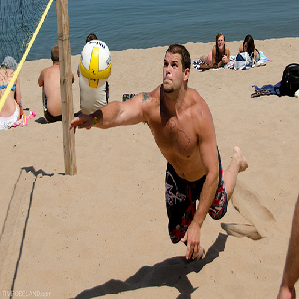

In [24]:
img

What type of Python object is `img`? We can check it with the `type` function and see that it's a Python Image data type.

In [25]:
type(img)

PIL.Image.Image

Now let's convert it to a numpy array so that we can feed it to the model. We will use the `img_to_array` function from the `image` module we've just loaded:

In [26]:
img_array = image.img_to_array(img)

Now the image is an order-3 tensor with 229 pixels in Height and Width and 3 color channels for RGB:

In [27]:
img_array.shape

(299, 299, 3)

Keras convolutional models require an input with 4 axes, i.e. an order-4 tensor, where the first axis locates the image in the datset (in this case we only have one image, but we can still think of it as the first element in an order-4 array. We can add this "dummy" dimension with the `np.expand_dims` function:

In [28]:
img_tensor = np.expand_dims(img_array, axis=0)

Let's double check that the shape of this new tensor is the one we want:

In [29]:
img_tensor.shape

(1, 299, 299, 3)

## Predict class with pre-trained Xception

Amongst all the pre-trained models provided we really like the [`Xception`](https://arxiv.org/pdf/1610.02357v2.pdf) network. Not only it provides great accuracy with a small footprint and load time, but also it was invented by the founder of Keras, François Chollet. Let's go ahead and import the `Xception` class:

In [30]:
from tensorflow.keras.applications.xception import Xception

We can create a pre-trained model simply by creating an instance of `Xception` with the `weights='imagenet'` parameter. This command will download the pre-trained weights and create a model with the `Xception` architecture.

> TIP: note that it could take a few minutes to download the weights.

In [31]:
model = Xception(weights='imagenet')

Let's have a look at the model architecture by printing the summary:

In [32]:
model.summary()

Model: "xception"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 299, 299, 3) 0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 149, 149, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
block1_conv1_bn (BatchNormaliza (None, 149, 149, 32) 128         block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_conv1_act (Activation)   (None, 149, 149, 32) 0           block1_conv1_bn[0][0]            
___________________________________________________________________________________________

Wow! What a huge model! Notice that it has almost 23 Million parameters and many convolutional layers stacked on top of one another. Let's test the pre-trained model on the task of recognizing an image without training.

We will need to pre-process the image so that it has the correct format for the network. Luckily for us, the `keras.applications.xception` module also contains a `preprocess_intput` function that is precisely what we need. Let's load it:

In [33]:
from tensorflow.keras.applications.xception import preprocess_input

and let's apply it to a copy of our tensor image:

> TIP: we apply it to a copy because the function alters the argument itself and we don't want to alter the original version of the image.

In [34]:
img_scaled = preprocess_input(np.copy(img_tensor))

`img_scaled` is scaled such that the minimum value is -1 and the maximum value is 1. We can pass it to the model and generate a prediction:

In [35]:
preds = model.predict(img_scaled)

What do our predictions look like? What is the output of the model? Let's first look at the shape of the `preds` object:

In [36]:
preds.shape

(1, 1000)

`preds` is a vector with 1000 entries. This makes sense: they are the probabilities associated with each of the 1000 classes of objects in the Imagenet dataset.

To recap, our pre-trained Xception model takes an image in input and returns a softmax classification output with 1000 classes. To interpret the prediction, we will load the `decode_predictions` function:

In [37]:
from tensorflow.keras.applications.xception import decode_predictions

and apply it to the `preds` vector to get the top three most likely labels for the photo.

In [38]:
decode_predictions(preds, top=3)[0]

[('n04540053', 'volleyball', 0.9431327),
 ('n09421951', 'sandbar', 0.021305429),
 ('n04371430', 'swimming_trunks', 0.0068396116)]

Not bad! Our model this it's very likely that the photo is about volleyball, which is not far from beach volley at all! That is awesome Now let's do even better, let's repurpose the model so that it will work with exactly the three categories of pictures we have. This is called _Transfer Learning_.

## Transfer Learning

[Transfer Learning]() consists in leveraging a pre-trained model to solve a similar task. In this case, we're going to use a network that was trained on Imagenet and re-purposed it to solve the sports image classification task. By using a pre-trained network, we don't need to train it completely from scratch, a great advantage both for the computing power required and the amount of data needed. 

We will be able to adapt a huge network like Xception, that has more than 20 Million parameters, using a laptop and a few thousand images. This is an incredibly powerful function! Let's see how we do it.

First of all, we're going to set a value for the `img_size = 299`. This is the correct input size for Xception, and it corresponds to the size of images used to train it.

In [39]:
img_size = 299

We reload the `Xception` model, but this time we include a couple more arguments besides the weights. 

First of all, we specify `include_top=False`. This option says we don't want the full model, but only the convolutional part. If you remember what we've learned in [Lab 6 on CNNs](./06_Convolutional_Neural_Networks.ipynb), convolutional models are composed by a cascade of convolutional layers that yield more and more specialized feature maps. 

At some point, the feature maps are flattened to an array which is fed to a `Dense` layer (or a series of `Dense` layers) and finally to the output of the classification. Here we want to load all the layers of Xception up to the layer before the last fully connected (the _top_ layer). The reason we want to do this is simple to explain. We want to use the pre-trained model as a giant pre-processing layer that takes an image in input and returns a few thousand high-level features (we will see these are called _bottleneck features_). We will then use these high-level features to perform a standard classification with only the classes of images present in our dataset, i.e., the three sports.

![Transfer Learning with Xception model](./assets/conv_dense_xception.png)

When loading the Xception model, we also specify the `input_shape` and an additional parameter `pooling='avg'`. This last one specifies how we'd like to go from the order-4 tensor of the feature maps to the order-2 tensor that goes in the fully connected top.  `pooling='avg'` means we're going to apply a Global Average Pooling layer at the end. 

Let's load this into a variable called `base_model`:

In [40]:
base_model = Xception(include_top=False,
                      weights='imagenet',
                      input_shape=(img_size, img_size, 3),
                      pooling='avg')

Now that we've loaded the base model, we're going to complete the model with a couple of dense layers. First we load the `Sequential` model and the `Dense` and `Dropout` layers:

In [41]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout

Let's create model with the following architecture. 

First, we pass the whole `base_model` as the first layer. This will take an input image, process it with the pre-trained `Xception` weights, and pass an array of numbers to the next layer. Then we'll load a fully connected layer with 256 nodes and a ReLU activation, then Dropout and finally the output layer with three nodes and a Softmax. Remember that we have only three classes:

- Beach volleyball
- Cross-country skiing
- Formula racing

that are mutually exclusive, i.e., a picture is only about one of the three sports, so our output needs to have three nodes with a Softmax:

In [42]:
model = Sequential()
model.add(base_model)
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(3, activation='softmax'))

Let's take a quick look at the model summary:

In [43]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
xception (Model)             (None, 2048)              20861480  
_________________________________________________________________
dense (Dense)                (None, 256)               524544    
_________________________________________________________________
dropout (Dropout)            (None, 256)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 3)                 771       
Total params: 21,386,795
Trainable params: 21,332,267
Non-trainable params: 54,528
_________________________________________________________________


Wow! This model still has 20+ millions of parameters. Now here's the trick: we're going to set most of them to be frozen, i.e., backpropagation will not touch them at all! We obtain this by setting the `.trainable` attribute of a layer to `False`. Since we've added the `base_model` as the first layer, we'll only need to set that flag:

In [44]:
model.layers[0].trainable = False

Let's recheck the model summary.

In [45]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
xception (Model)             (None, 2048)              20861480  
_________________________________________________________________
dense (Dense)                (None, 256)               524544    
_________________________________________________________________
dropout (Dropout)            (None, 256)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 3)                 771       
Total params: 21,386,795
Trainable params: 525,315
Non-trainable params: 20,861,480
_________________________________________________________________


Of the total number of parameters only a half a million are now trainable, the ones that belong to the two dense layers we've added after the `base_model`. This seems a much more tractable model than the original one! 

Let's go ahead and compile the model:

In [46]:
model.compile(optimizer='rmsprop',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

We are now ready to train it.

## Data augmentation

Since we don't have too much data available, we'll use the trick of data augmentation learned in [Lab 10](./10_Performance_Improvement.ipynb#Data-augmentation). This consists in generating variations of an image with transformations such as zoom, rotate and shear. Let's load the `ImageDataGenerator`:

In [47]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

Let's set a `batch_size = 32`. The choice of this number is somewhat arbitrary, but since we have three classes only, a batch of 32 images will contain on average about ten images for each class. This seems a good number of examples to learn something from:

In [48]:
batch_size = 32

Now let's create an instance of `ImageDataGenerator` that applies transformations to the training set. It will do the following operations:

- apply the `preprocess_input` function to an image
- rotate it with an angle between -15 and 15 degrees
- apply a shift both in width and height up to ±20%
- apply a shear up to 5 degrees
- apply a zoom between 0.8 and 1.2
- possibly flip the image left to right
- fill the borders with the nearest pixel

In [49]:
train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=15,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=5,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')

The `train_datagen` object contains the instructions about the transformations to apply; now we need to tell it where to source the images from. We'll use the very convenient `.flow_from_directory` method, specifying the path of the training images, the target size, and the batch size:

In [50]:
train_generator = train_datagen.flow_from_directory(
    train_path,
    target_size=(img_size, img_size),
    batch_size=batch_size)

Found 2100 images belonging to 3 classes.


As you can see, it found 2100 images with three classes. This is because the images are arranged in 3 subfolders of the train path:

    train_path
        |- Beach volleyball
            |- img1
            |- img2
            |- ...
        |- Cross-country skiing
            |- img1
            |- img2
            |- ...
        |- Formula racing
            |- img1
            |- img2
            |- ...
            
Now let's also create a generator for the test images. Note that the `test_path` must have the same subfolders to be compatible with the training set. We will not apply any transformation to test images, and we will flow them as they are. The reason for this is to have reproducible test results:

In [51]:
test_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input)

We will flow test images from the `test_path` directory:

In [52]:
test_generator = test_datagen.flow_from_directory(
    test_path,
    target_size=(img_size, img_size),
    batch_size=batch_size,)

Found 902 images belonging to 3 classes.


We are now ready to train the model with our generator. Since we are generating images with a generator, the concept of Epoch is no longer well defined. For this reason, we will specify how many updates an epoch includes.

Let's see: we have 2100 images in the training folder and we feed batches of 32 images. This means that with approximately 65 steps we have sent roughly as many images as there are in the training set. Let's do this: we train the model for one epoch with 65 update steps:

In [53]:
model.fit_generator(
    train_generator,
    steps_per_epoch=65,
    epochs=1)

65/65 [==============================] - 48s 742ms/step - loss: 0.5416 - accuracy: 0.8032


It took a little bit of time, but it looks promising. In a single epoch we have re-purposed a huge convolutional Neural Network that can now perform image recognition on new classes of images, never before encountered. Cool!

Let's assess the accuracy or our model with the `.evaluate_generator` method on the test set:

In [54]:
model.evaluate_generator(test_generator, steps=len(test_generator))

[0.2009344095813817, 0.91906875]

Not bad at all, considering that it only trained for one epoch. Also, let's check the prediction on our original image of the volleyball player:

In [55]:
model.predict_classes(img_tensor)

array([2])

It's predicted to be in class `0`, which is the correct class. We can check that by looking at the `class_indices` defined in the `test_generator`:

In [56]:
train_generator.class_indices

{'Beach volleyball': 0, 'Cross-country skiing': 1, 'Formula racing': 2}

Awesome! We've performed transfer learning for the first time, and we've reused a giant pre-trained model for our goal. This was good, but it did take a bit of a long time to train. Can we speed that up? The answer is yes! Let's introduce bottleneck features.

## Bottleneck features

Let's stop for a second and think back about what we've just done. First, we've loaded a large convolutional network, whose weights have been pre-trained on the Imagenet problem. 

Then we've used the convolutional part of this network as the first layer of a new network, followed by fully connected layers. Since its weights are frozen, the convolutional part of the network is acting as a  feature extractor, that extracts a vector of features from the given input image.

![Bottleneck features](./assets/conv_bottlenecks.png)

These features then go into the fully connected layers which perform the classification. The training process is still slow because it still applies all the convolutions to the image at each training step.

On the other hand, since the weights are frozen, we could take a different approach. We could pre-process all the images once: send them through the convolutional part of the network and extract a feature vector for each of them. We could use this dataset of feature vectors to train a fully connected network for the classification.

Another way to look at this process is to say that we are using the pre-trained network as a feature extraction pipeline, not dissimilar from traditional pipelines involving Wavelets, Histograms and so on. The difference here is that the bottleneck features come from a network pre-trained on the Imagenet classification and are therefore optimized for that task.

Let's start by wrapping the `ImageDataGenerator` and the `.flow_from_directory` method in a single function. This function takes the `input_path` of the images and a couple of other parameters and returns a generator ready to receive all the images in the `input_path`. We'll feed this generator to the `base_model.predict_generator` function, which will return the values of the last layer before the output layer of the full model (remember we loaded the model with the parameter `include_top=False`. Also, notice that we will set `shuffle=False` so that the image order is the same as that contained in `generator.classes` and we can later use it.

Here's the function:

In [57]:
def bottleneck_generator(input_path,
                         img_size=299,
                         batch_size=32,
                         shuffle=False):
    
    # ImageDataGenerator that applies preprocess_input to each image
    datagen = ImageDataGenerator(
        preprocessing_function=preprocess_input)
    
    # return batches of preprocessed and scaled images
    # together with their labels. Images are taken
    # from input_path, labels are generated from the
    # subdir stucture. In input_path there are 
    # 3 subfolders, so there'll be 3 labels.
    generator = datagen.flow_from_directory(
        input_path,
        target_size=(img_size, img_size),
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=shuffle)
    
    return generator

Let's use this function to generate the bottlenecks for the training images:

In [58]:
train_generator = bottleneck_generator(train_path)
bottlenecks_train = base_model.predict_generator(
    train_generator, steps=len(train_generator),
    verbose=1)

Found 2100 images belonging to 3 classes.
66/66 [==============================] - 34s 516ms/step


Let's also recover the training labels from the same generator.

In [59]:
labels_train = train_generator.classes

Depending on your system, generating bottlenecks may take a long time and having one or more GPU available will surely speed up the process. Since they are quite small, the code repository already contains a saved version of these bottlenecks.

Now that we have created the bottlenecks let's check them. Let's start from the shape of the tensors:

In [60]:
bottlenecks_train.shape

(2100, 2048)

Train bottlenecks are a matrix with as many rows as there are images in the training set and with as many columns as the outputs of the base model's last layer, i.e., the `GlobalAveragePooling` layer from `Xception`, i.e., 2048 features. Let's plot a few of them to see how they are. Let's get a bunch of images and labels from the training generator:

In [61]:
images, labels = bottleneck_generator(
    train_path, shuffle=True, batch_size=256).next()

Found 2100 images belonging to 3 classes.


Moreover, let's create a list with the label names for each of the images in the batch. We will do this in two steps. First, let's create a label map with the label names corresponding to the class indices:

In [62]:
label_map = list(train_generator.class_indices.keys())
label_map

['Beach volleyball', 'Cross-country skiing', 'Formula racing']

Then let's use the `label_map` to convert the labels into the corresponding label names:

In [63]:
label_names = [label_map[i] for i in labels.argmax(axis=1)]

label_names[:10]

['Cross-country skiing',
 'Formula racing',
 'Beach volleyball',
 'Cross-country skiing',
 'Beach volleyball',
 'Cross-country skiing',
 'Formula racing',
 'Cross-country skiing',
 'Beach volleyball',
 'Beach volleyball']

Great. Now let's generate bottleneck features for the images in the batch:

In [64]:
bottlenecks = base_model.predict(images, verbose=1)

256/256 [==============================] - 3s 11ms/sample


Will bottlenecks of images with the same label be similar? Let's take a look at them on a plot and see if there's any pattern we can recognize. We will create a figure with three plots, one for each of the three classes, and plot the values of the bottlenecks:

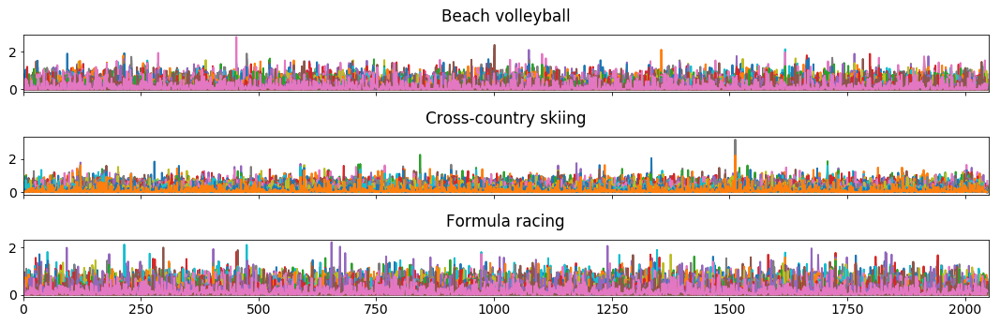

In [65]:
fig, ax = plt.subplots(nrows=3, ncols=1,
                       sharex=True, figsize=(15, 5))

for bn, label in zip(bottlenecks, label_names):
    idx = train_generator.class_indices[label]
    ax[idx].plot(bn)
    ax[idx].set_title(label)

plt.xlim(0, 2050)
plt.tight_layout()

Hmm, although the three plots look somewhat different, it's hard to tell if anything is interesting. Let's zoom in to the range 980-1010:

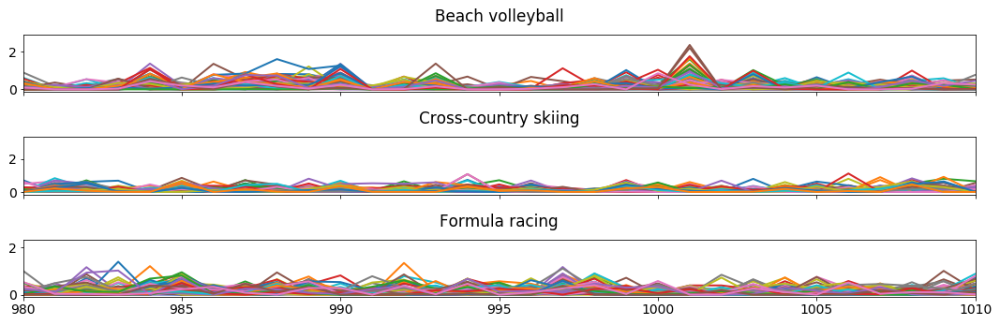

In [66]:
fig, ax = plt.subplots(nrows=3, ncols=1,
                       sharex=True, figsize=(15, 5))

for bn, label in zip(bottlenecks, label_names):
    idx = train_generator.class_indices[label]
    ax[idx].plot(bn)
    ax[idx].set_title(label)

plt.xlim(980, 1010)
plt.tight_layout()

Here it's clearer that several of the Beach Volleyball bottlenecks have a high spike at features 984, 990 and 1001, while the other two sports do not have those peaks. Bottlenecks are like fingerprints of an image: features extracted through convolutions that encode the content of the image.

Now that we understand a little more what bottleneck features are, we can save them to disk once and for all. We can now experiment with fully connected architectures that classify the bottlenecks as input data. Let's save the bottlenecks and the labels as numpy arrays.
We will use the `gzip` library for efficiency.

In [67]:
import gzip

In [68]:
fname_ = '../data/sports/bottlenecks_train.npy.gz'
np.save(gzip.open(fname_, 'wb'), bottlenecks_train)

In [69]:
fname_ = '../data/sports/labels_train.npy'
np.save(open(fname_, 'wb'), labels_train)

Let's also generate the bottlenecks for the test set:

In [70]:
test_generator = bottleneck_generator(test_path)
bottlenecks_test = base_model.predict_generator(test_generator, verbose=1, steps=len(test_generator))

Found 902 images belonging to 3 classes.
29/29 [==============================] - 15s 501ms/step


and the test labels:

In [71]:
labels_test = test_generator.classes

and let's save them too:

In [72]:
fname_ = '../data/sports/bottlenecks_test.npy.gz'
np.save(gzip.open(fname_, 'wb'), bottlenecks_test)

In [73]:
fname_ = '../data/sports/labels_test.npy'
np.save(open(fname_, 'wb'), labels_test)

Great! Now let's see how we use the bottlenecks.

## Train a fully connected on bottlenecks

Bottlenecks saved to disk can be restored by reading them. Let's read them into two variables called `X_train` and `X_test`.

In [74]:
fname_ = '../data/sports/bottlenecks_train.npy.gz'
X_train = np.load(gzip.open(fname_, 'rb'))

fname_ = '../data/sports/bottlenecks_test.npy.gz'
X_test = np.load(gzip.open(fname_, 'rb'))

We can check the shape of the train data, and verify that it's a matrix:

In [75]:
X_train.shape

(2100, 2048)

Similarly, let's load the labels:

In [76]:
fname_ = '../data/sports/labels_train.npy'
y_train = np.load(open(fname_, 'rb'))

fname_ = '../data/sports/labels_test.npy'
y_test = np.load(open(fname_, 'rb'))

and check the shape as well:

In [77]:
y_train.shape

(2100,)

It looks like we have to one-hot encode the labels, so let's do that using the `keras.utils.to_categorical` function that we have used many times in the labs:

In [78]:
from tensorflow.keras.utils import to_categorical

In [79]:
y_train_cat = to_categorical(y_train)
y_test_cat = to_categorical(y_test)

Now we are finally ready to train a fully connected network on the bottleneck features. Let's import the `Sequential` model and `Dense` and `Dropout` layers.

In [80]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout

We'll define the model using the sequential API. We will build a very simple model with just 2 layers: a `Dropout` layer as input, that will receive the bottleneck features and a `Dense` output layer for the output. The output layer must have 3 nodes because there are 3 classes and it must have a `softmax` activation function because the classes are mutually exclusive. Feel free to change the model definition to something else if you'd like, keeping in mind that we only have a few thousand training data points so giving the model too much freedom may lead to overfitting.

Notice that instead of adding the layers like we did in other parts of the labs we can pass a list of layers to the model constructor:

In [81]:
fc_model = Sequential([
    Dropout(0.5, input_shape=(2048,)),
    Dense(16, activation='relu'),
    Dropout(0.5),
    Dense(3, activation='softmax')
])

Let's compile the model with our preferred optimizer using the `categorical_crossentropy` loss:

In [82]:
fc_model.compile(optimizer='rmsprop',
                 loss='categorical_crossentropy',
                 metrics=['accuracy'])

Here's a summary of the model:

In [83]:
fc_model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dropout_1 (Dropout)          (None, 2048)              0         
_________________________________________________________________
dense_2 (Dense)              (None, 16)                32784     
_________________________________________________________________
dropout_2 (Dropout)          (None, 16)                0         
_________________________________________________________________
dense_3 (Dense)              (None, 3)                 51        
Total params: 32,835
Trainable params: 32,835
Non-trainable params: 0
_________________________________________________________________


This simple model has a little over 6000 parameters, so it will be very fast to train. Let's train it for a few epochs:

In [84]:
history = fc_model.fit(X_train, y_train_cat,
                       epochs=20,
                       verbose=0,
                       batch_size=batch_size,
                       validation_data=(X_test, y_test_cat))

And let's plot the accuracy:

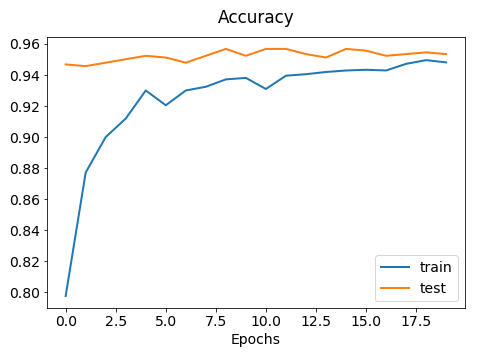

In [85]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Accuracy')
plt.legend(['train', 'test'])
plt.xlabel('Epochs');

This model trained really fast and the accuracy on the test set is higher than the accuracy on the training set, which is a really good sign. This is the value of bottleneck features, we can use them as proxies for our original images and train a simple model using them using a laptop.

### Image search

A fun application of pre-trained models is image search.

Imagine the following situation: we have a dataset of images, and we would like to find the most similar images to a specific one, for example, we have our collection of pictures on our laptop, and we'd like to see all the ones with a particular person.

Solving this problem requires the definition of a distance measure between images, so that, given a picture, we can look for images that are close to it. This is hard to do using the raw pixels as features because, as we have seen many times, images with similar content may look completely different on every single pixel.

On the other hand, since bottleneck features capture high level features from the images, we exploit them to locate similar images. We will do this using the `DistanceMetric` class from Scikit Learn. Let's start by importing it:

In [86]:
from sklearn.neighbors import DistanceMetric

and let's load an instance of the Euclidean metric, which is the usual vector difference distance:

In [87]:
dist = DistanceMetric.get_metric('euclidean')

We have used to define the [Mean Squared Error in Lab 3](./03_Machine_Learning.ipynb#Cost-Function) and it is obtained through the sum of the squares of the differences along each coordinate:

\begin{equation}
d(\textbf{x'}, \textbf{x}) = \sqrt{(\textbf{x'} - \textbf{x})^2}  = \sqrt{\sum_i (x'_i - x_i)^2}
\end{equation}

and given the two vectors:

In [88]:
a = np.array([1, 2])

In [89]:
b = np.array([2, -1])

it is calculated as:

In [90]:
np.sqrt(np.square(a - b).sum())

3.1622776601683795

Now that we have defined the euclidean distance metric we can calculate the pairwise distances between all the bottlenecks and then use that for our image search engine. 

Let's take a few images as an example. Let's get the training images from the training set using the bottleneck data generator:

In [91]:
images, labels = bottleneck_generator(
    train_path, batch_size=2100).next()

Found 2100 images belonging to 3 classes.


and let's display a few of them. Note that since our images were normalized during pre-processing, their pixels are now values between -1 and 1. `plt.imshow` requires floating point images to have values between 0 and 1 so we will need to add 1 and divide by 2 each pre-processed image to display it correctly.
Let's define a helper function that does that.

In [92]:
def imshow_scaled(img):
    plt.imshow((img + 1) / 2)

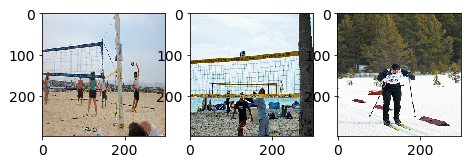

In [93]:
plt.subplot(1, 3, 1)
imshow_scaled(images[0])

plt.subplot(1, 3, 2)
imshow_scaled(images[1])

plt.subplot(1, 3, 3)
imshow_scaled(images[900])

The first two are images of beach volleyball while the third one is of skiing.

The distance between the first and the second image is:

In [94]:
np.sqrt(np.square(X_train[0] - X_train[1]).sum())

6.732092

while the distance between the first and the third is:

In [95]:
np.sqrt(np.square(X_train[0] - X_train[900]).sum())

10.117224

As you can see, the first and the third image are further apart, which makes sense since the last one is very different from the previous two. We will proceed now to calculate all the distances between all of the images in the training set using their bottleneck features. 

We will do this calculation using the `.pairwise` method of the Euclidean distance object we have created previously. We could also do a double for loop over bottlenecks and calculate the distances manually. However, this is more efficient:

In [96]:
bn_dist = dist.pairwise(X_train)

Let's check the shape of the matrix we have obtained:

In [97]:
bn_dist.shape

(2100, 2100)

Since we have 2100 images in the training set, the pairwise matrix is a square symmetric matrix that contains all pairwise distances. Let's visualize it to understand it a little bit better:

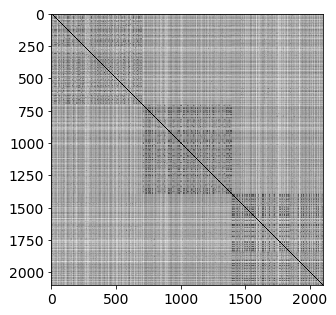

In [98]:
plt.imshow(bn_dist, cmap='gray')

Notice a couple of things about this matrix:
1. The darker a pixel, the closer two corresponding images are.
- The matrix is symmetric on the diagonal, which makes sense since the distance between image 1 and image 2 is the same as the distance between image 2 and image 1
- The diagonal is the darkest of all, which also makes sense since an image will identical to itself and therefore have a distance of zero from itself
- Three blocks are distinguishable along the diagonal, although a little fuzzy. This makes sense because images are sorted by class and generally speaking all the images in a class are expected to be more similar to one another than to images in other classes

Notice that we have obtained these distances using the bottlenecks from the pre-trained model, no additional training needed. Awesome!

Let's put this to use in our search engine! Let's take an image:

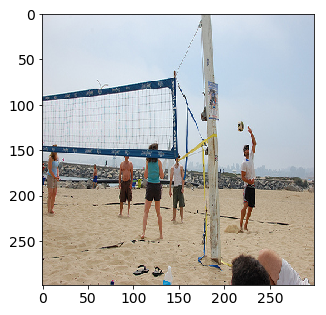

In [99]:
imshow_scaled(images[0])

Let's look for the top 9 closest images. All we have to do is select the row in the `bn_dist` matrix corresponding to the index of the image selected, which is zero in this case. We will wrap this with a Pandas Series so that we can use the indices later:

In [100]:
dist_from_sel = pd.Series(bn_dist[0])

Let's sort these and display the first few images:

In [101]:
dist_from_sel.sort_values().head(9)

0      0.000000
15     5.394073
431    5.428693
32     5.695895
636    5.838955
429    6.040286
656    6.052958
48     6.083421
270    6.218911
dtype: float64

Let's display these. We will display 9 images, in a grid of 3x3. Let's make this configurable by defining a few parameters:

In [102]:
n_rows = 3
n_cols = 3
n_images = n_rows * n_cols

Now let's take the top 9 images with the shortest distance from our orignal image. This can be done by sorting the values in `dist_from_sel` and then using the `.head` command that retrieves the first elements in the series:

In [103]:
retrieved = dist_from_sel.sort_values().head(n_images)

Now let's loop over the index of the retrieved images and plot the images:

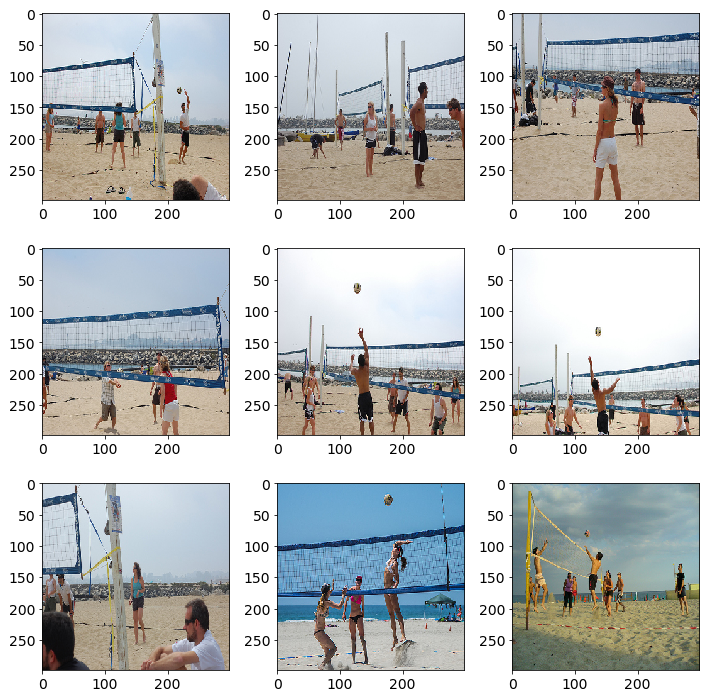

In [104]:
plt.figure(figsize=(10, 10))
i = 1
for idx in retrieved.index:
    plt.subplot(n_rows, n_cols, i)
    imshow_scaled(images[idx])
    i += 1
plt.tight_layout()

Nice! The first image displayed is the one we had selected, and as you can see the other ones are all very similar! Let's try again with another image. We will define a function to make things easy:

In [105]:
def image_search(img_index, n_rows=3, n_columns=3):
    n_images = n_rows * n_columns

    # create Pandas Series with distances from image
    dist_from_sel = pd.Series(bn_dist[img_index])
    
    # sort Series and get top n_images
    retrieved = dist_from_sel.sort_values().head(n_images)
    
    # create figure, loop over closest images indices 
    # and display them
    plt.figure(figsize=(10, 10))
    i = 1
    for idx in retrieved.index:
        plt.subplot(n_rows, n_cols, i)
        imshow_scaled(images[idx])
        if i == 1:
            plt.title('Selected image')
        else:
            plt.title("Dist: {:0.4f}".format(retrieved[idx]))
        i += 1
    plt.tight_layout()

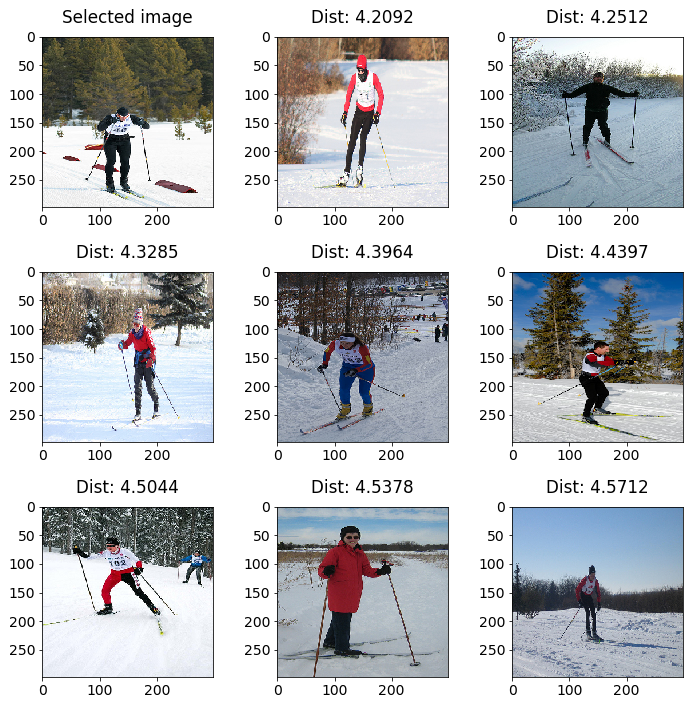

In [106]:
image_search(900)

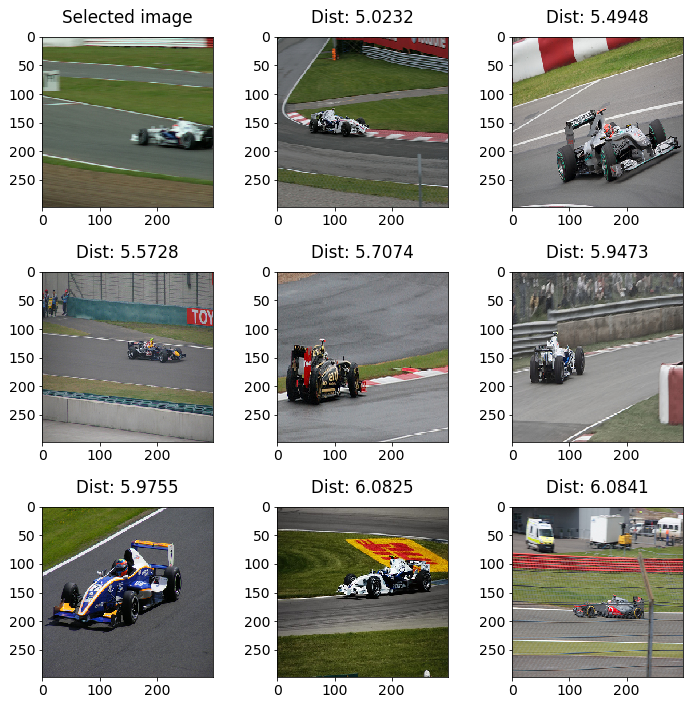

In [107]:
image_search(1600)

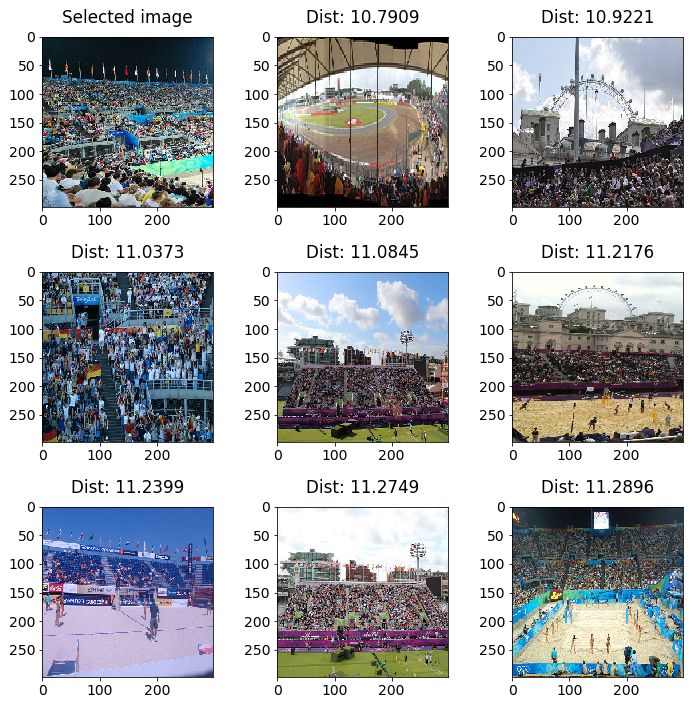

In [108]:
image_search(100)

Notice that we can also sort the distances in reverse order and find the images wich are the furthest away from a selected image. E.g., for this image:

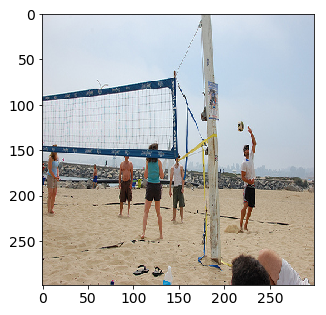

In [109]:
imshow_scaled(images[0])

The most distant images are:

In [110]:
retrieved = pd.Series(bn_dist[0]).sort_values(ascending=False).head(9)

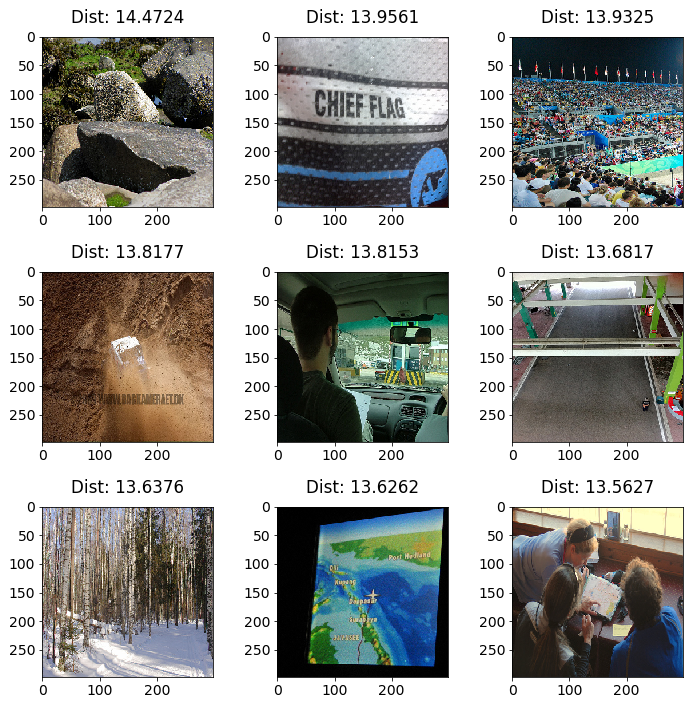

In [111]:
plt.figure(figsize=(10, 10))
i = 1
for idx in retrieved.index:
    plt.subplot(n_rows, n_cols, i)
    imshow_scaled(images[idx])
    plt.title("Dist: {:0.4f}".format(retrieved[idx]))
    i += 1
plt.tight_layout()

Which clearly have very little in common with the above image!

In conclusion, Keras offers several pre-trained models for images, that can be used for a variety of tasks including image recognition, transfer learning and image similarity search.

## Exercises

### Exercise 1

Use a pre-trained model on a different image.

- Download an image from the web
- Upload the image through the Jupyter home page
- load the image as a numpy array
- re-run the pre-train to see if the pre-trained model can guess your image
- can you find an image that is outside of the Imagenet classes? (you can see which classes are available [here](https://gist.github.com/aaronpolhamus/964a4411c0906315deb9f4a3723aac57).

### Exercise 2

Choose another pre-trained model from the ones provided at https://keras.io/applications/ and use it to to predict the same image. Do the predictions match?

### Exercise 3

The [Keras documentation](https://keras.io/applications/) shows how to fine-tune the Inception V3 model by unfreezing some of the convolutional layers. Try reproducing the results of the documentation on our dataset using the Xception model and unfreezing some of the top convolutional layers.